<a href="https://colab.research.google.com/github/kocurvik/edu/blob/master/HUPV/notebooks/solutions/cv08_en_solution.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lab 8 - Custom Layers

In this lab, we will play with one artificial problem. We will work with grayscale images to which we will add regular (wavy) noise. We will add it using image modification in the Fourier spectrum. This will be ensured by a function that I provide for you. In order to account for it in the exercise, we will only add horizontal noise. You can play with the code and try to improve the detection of oblique noise as well.

We will test everything on a dataset that is a subset of the ImageNet dataset [1] in reduced form to $91 \times 91$ and the images are grayscale.

In this exercise, we will create a data generator, a custom loss function and a metric to track accuracy and a custom network layer.

  - [1] Deng, J., Dong, W., Socher, R., Li, L.J., Li, K. and Fei-Fei, L., 2009, June. Imagenet: A large-scale hierarchical image database. In 2009 IEEE conference on computer vision and pattern recognition (pp. 248-255). IEEE.

## Disclaimer

In order to demonstrate the use of stride, we will use convolutional networks, the architecture of which is unnecessarily complex for our task and does not achieve such good results. Even a simple fully connected network would suffice for this simple problem. The exercise is meant for you to familiarize yourself with the new elements of code not which problems to apply them to.

In [ ]:
import os

import torch
import cv2
import numpy as np
import matplotlib.pyplot as plt

First, we download the dataset and extract it. There are three components in the dataset `train`, `val` and `mini_train`. We have `mini_train' for preliminary testing of the training as we showed in the third lab.

In [ ]:
!wget https://liveuniba-my.sharepoint.com/:u:/g/personal/kocur15_uniba_sk/EZPqtoQf7khPilfzukCwa8EByxieDwqLEbm0vzMuG2v0rg?download=1
!mv EZPqtoQf7khPilfzukCwa8EByxieDwqLEbm0vzMuG2v0rg?download=1 dataset.zip

--2023-10-19 14:43:34--  https://liveuniba-my.sharepoint.com/:u:/g/personal/kocur15_uniba_sk/EZPqtoQf7khPilfzukCwa8EByxieDwqLEbm0vzMuG2v0rg?download=1
Resolving liveuniba-my.sharepoint.com (liveuniba-my.sharepoint.com)... 13.107.136.10, 13.107.138.10, 2620:1ec:8f8::10, ...
Connecting to liveuniba-my.sharepoint.com (liveuniba-my.sharepoint.com)|13.107.136.10|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: /personal/kocur15_uniba_sk/Documents/dewave_dataset.zip?ga=1 [following]
--2023-10-19 14:43:35--  https://liveuniba-my.sharepoint.com/personal/kocur15_uniba_sk/Documents/dewave_dataset.zip?ga=1
Reusing existing connection to liveuniba-my.sharepoint.com:443.
HTTP request sent, awaiting response... 200 OK
Length: 45265608 (43M) [application/x-zip-compressed]
Saving to: ‘EZPqtoQf7khPilfzukCwa8EByxieDwqLEbm0vzMuG2v0rg?download=1’

EZPqtoQf7khPilfzukC 100%[===================>]  43.17M  12.0MB/s    in 3.6s    

2023-10-19 14:43:39 (12.0 MB/s) - ‘EZPqtoQf7khPil

In [ ]:
!unzip -q dataset.zip

### Regular noise

These functions will add regular and remove noise. If you took the Advanced Image Processing (PSO) course, you should know the principle on which these functions work, if not, for the purposes of today's exercise, it is enough to consider these functions as a black box.

The function assumes images of the dimensions $91 \times 91$.

In [ ]:
def add_regular_noise(img, row, col, plot=False):
    # cols in range 1..48
    # rows in range 1..95
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)

    if plot:
        magnitude_spectrum = 20 * np.log(np.abs(fshift))
        plt.subplot(221), plt.imshow(img, cmap='gray')
        plt.title('Input Image'), plt.xticks([]), plt.yticks([])
        plt.subplot(222), plt.imshow(magnitude_spectrum, cmap='gray')
        plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])

    val = np.abs(f[0,0])/5

    fshift[row, col] = val
    fshift[90-row, 90-col] = val
    img_modified = np.real(np.fft.ifft2(np.fft.ifftshift(fshift)))

    if plot:
        magnitude_spectrum = 20 * np.log(np.abs(fshift))
        plt.subplot(223), plt.imshow(np.real(img_modified), cmap='gray')
        plt.title('Output Image'), plt.xticks([]), plt.yticks([])
        plt.subplot(224), plt.imshow(magnitude_spectrum, cmap='gray')
        plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
        plt.show()

    return img_modified


def remove_regular_noise(img, row, col, plot=False):
    # cols in range 1..48
    # rows in range 1..95
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)

    if plot:
        magnitude_spectrum = 20 * np.log(np.abs(fshift))
        plt.subplot(221), plt.imshow(img, cmap='gray')
        plt.title('Input Image'), plt.xticks([]), plt.yticks([])
        plt.subplot(222), plt.imshow(magnitude_spectrum, cmap='gray')
        plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])

    fshift[row, col] = 0
    fshift[90-row, 90-col] = 0
    img_modified = np.real(np.fft.ifft2(np.fft.ifftshift(fshift)))

    if plot:
        magnitude_spectrum = 20 * np.log(np.abs(fshift))
        plt.subplot(223), plt.imshow(np.real(img_modified), cmap='gray')
        plt.title('Output Image'), plt.xticks([]), plt.yticks([])
        plt.subplot(224), plt.imshow(magnitude_spectrum, cmap='gray')
        plt.title('Magnitude Spectrum'), plt.xticks([]), plt.yticks([])
        plt.show()

    return img_modified

We can test the functions.

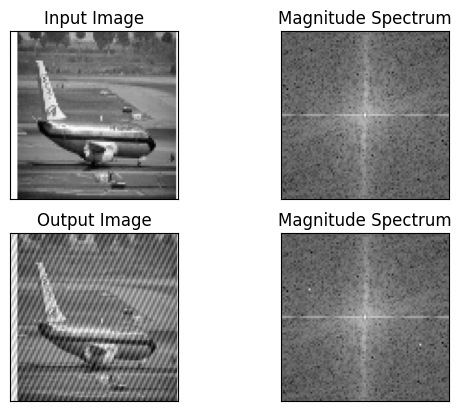

<ipython-input-4-0427fd5ba4e0>:49: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(np.abs(fshift))


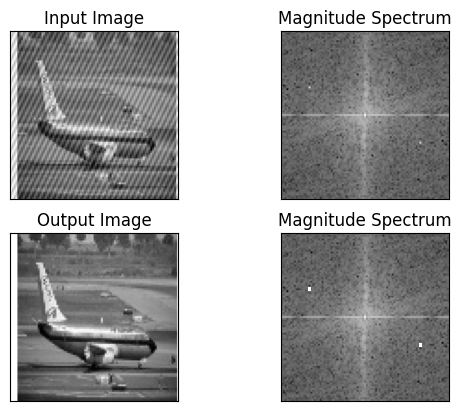

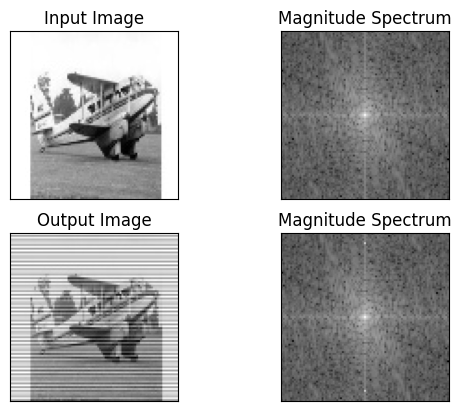

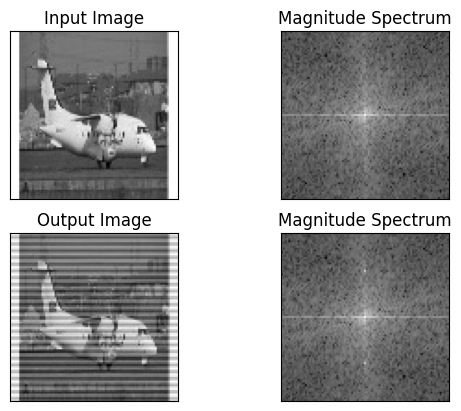

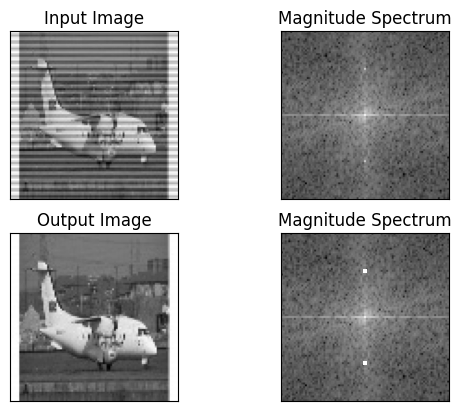

In [ ]:
img = cv2.cvtColor(cv2.imread('train/00652.jpg'),cv2.COLOR_BGR2GRAY)
img_modified = add_regular_noise(img, 30, 15, plot=True)
img_repaired = remove_regular_noise(img_modified, 30, 15, plot=True)

img = cv2.cvtColor(cv2.imread('train/00090.jpg'),cv2.COLOR_BGR2GRAY)
img_modified = add_regular_noise(img, 5, 45, plot=True)

img = cv2.cvtColor(cv2.imread('train/00450.jpg'),cv2.COLOR_BGR2GRAY)
img_modified = add_regular_noise(img, 20, 45, plot=True)
img_repaired = remove_regular_noise(img_modified, 20, 45, plot=True)


### Exercise 1 - Custom dataset

When training, we will always want to load a random image from a subset of images and then add random noise to it.

I will make my own dataset by implementing a custom class that will inherit `torch.utils.data.Dataset`. In order for the dataset to work, we just need to implement the `__len__`, `__getitem__` methods and, of course, the constructor.

In the constructor, we receive as an input argument the folder in which the images are located. Subsequently, we load them and store them as one large array of size $n \times 91 \times 91$ in the range of values from 0 to 1.

The `__len__` method returns the size of the dataset ie. the number of elements of the training set. In our case, we wouldn't have to limit ourselves to the number of images, but it's the easiest solution at the moment.

The `__getitem__` method has one argument, the index of the element we want. We need this index so that the dataset can mix individual elements and at the same time so that it can be easily parallelized. So in our case, we load the i-th element from the set of images and then add random noise to it. We will limit ourselves to horizontal or vertical noise only. That is as the second parameter in the `add_regular_noise` function, you always use the number 45. At the output, this method returns a dict that will have the keys `img`, in which there will be an image as $1 \times 91 \times 91$ torch tensor as float32 and a `row` in which will be the int value you used when adding noise. Generate this value randomly in the range 1 to 45. Implement this method.

In [ ]:
class RegularNoiseDataset(torch.utils.data.Dataset):
  def __init__(self, dir_path):
    files = os.listdir(dir_path)
    images = []
    for file in files:
        file = file.strip()
        images.append(cv2.cvtColor(cv2.imread(os.path.join(dir_path, file)), cv2.COLOR_BGR2GRAY))

    # the network won't work without this
    self.images = np.array(images) / 255


  def __len__(self):
    return len(self.images)

  def __getitem__(self, idx):
    img = self.images[idx]
    row = np.random.randint(1, 46)
    img = add_regular_noise(img, row, 45, plot=False).astype(np.float32)

    sample = {'img': torch.from_numpy(img[np.newaxis, ...]), 'row': row}

    # sample = {'img': None, 'row': None}

    return sample

The following code should run and show the original images and below them the images with added noise. The Fourier spectra will also be displayed.

<ipython-input-4-0427fd5ba4e0>:49: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(np.abs(fshift))


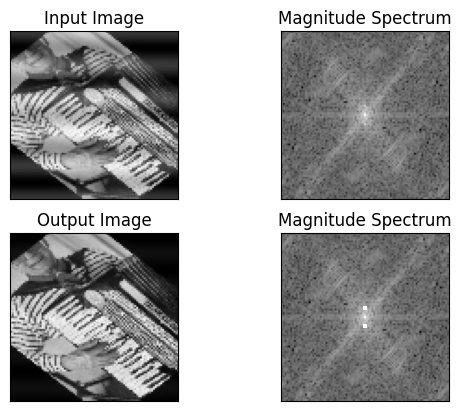

tensor(40)


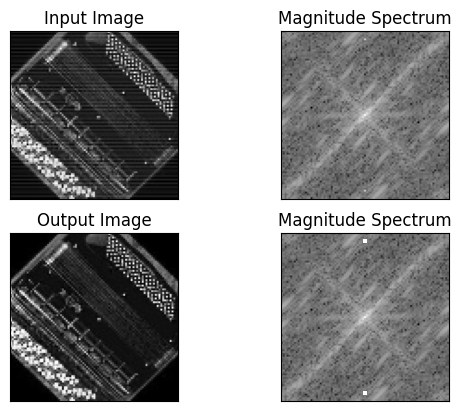

tensor(4)


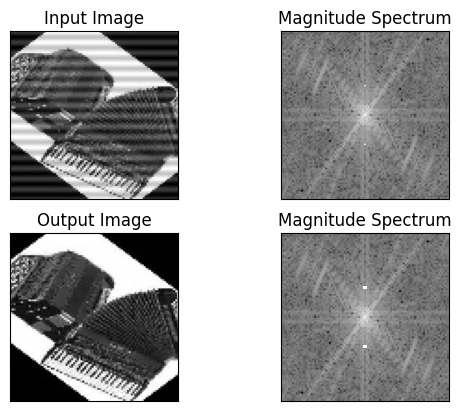

tensor(29)


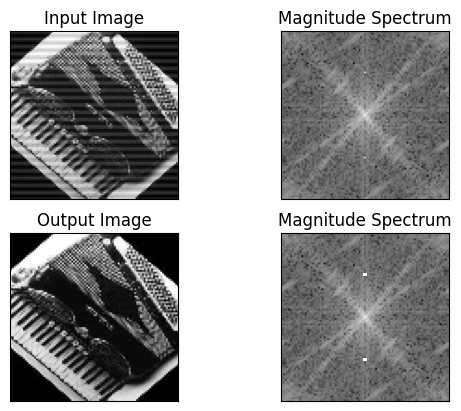

tensor(22)


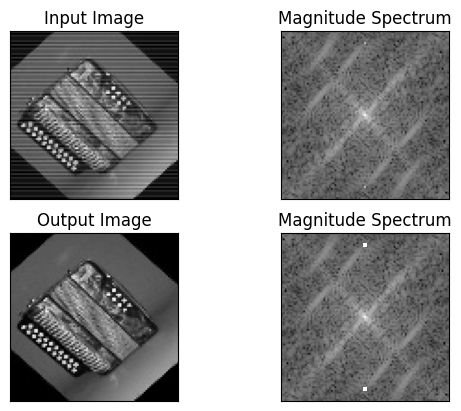

tensor(6)


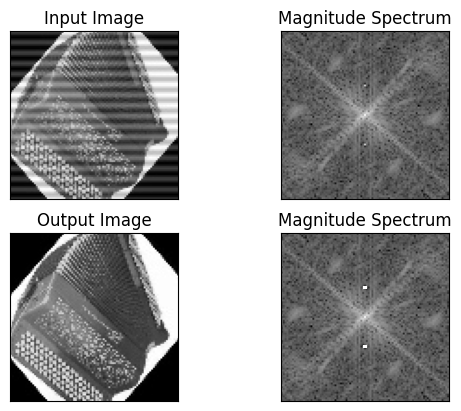

tensor(29)


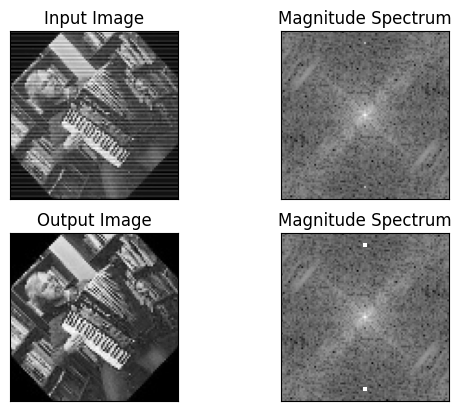

tensor(6)


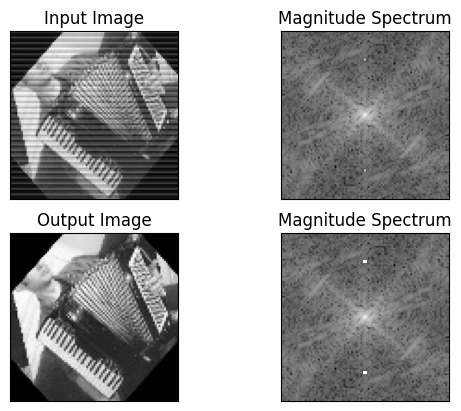

tensor(15)


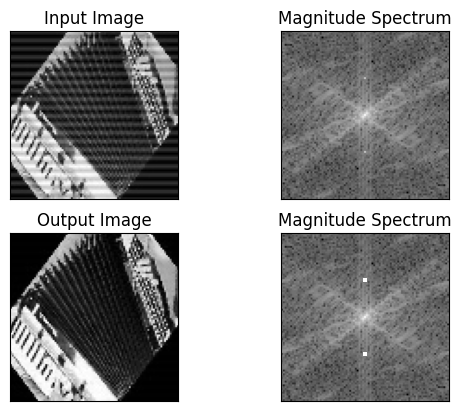

tensor(25)


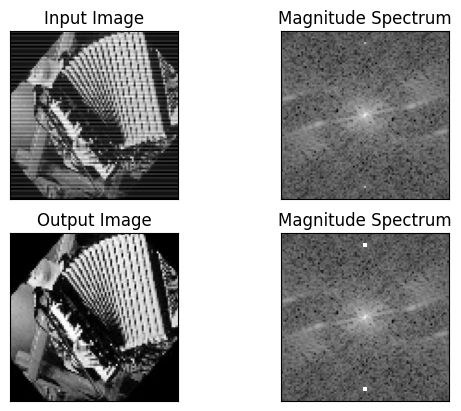

tensor(6)


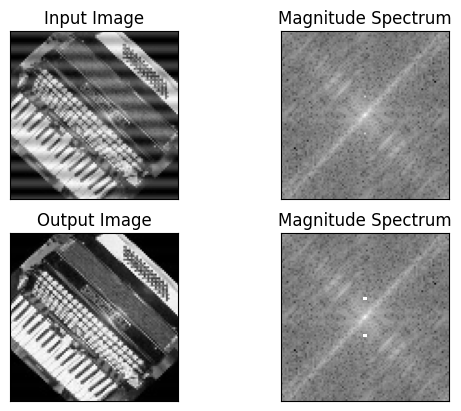

tensor(35)


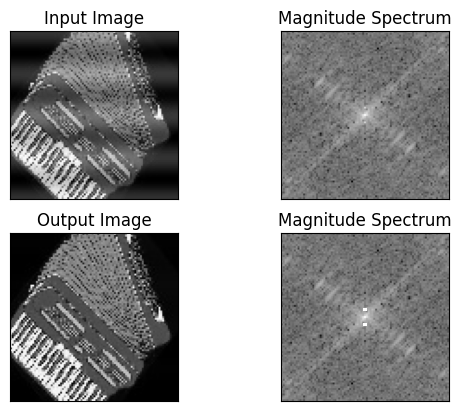

tensor(41)


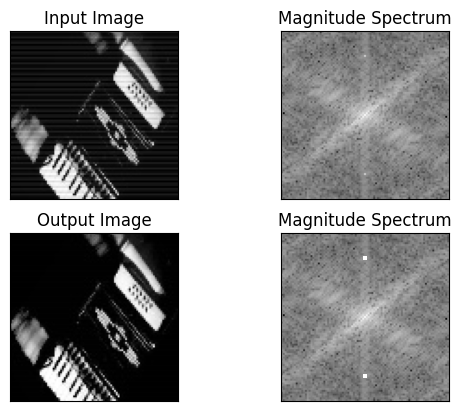

tensor(13)


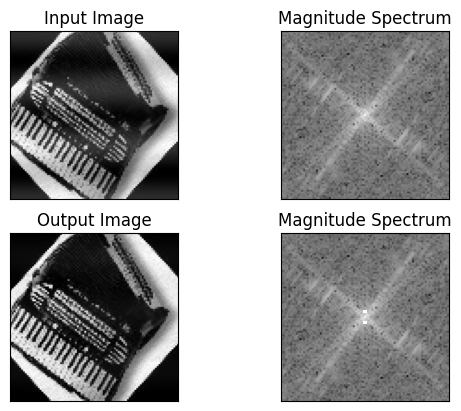

tensor(42)


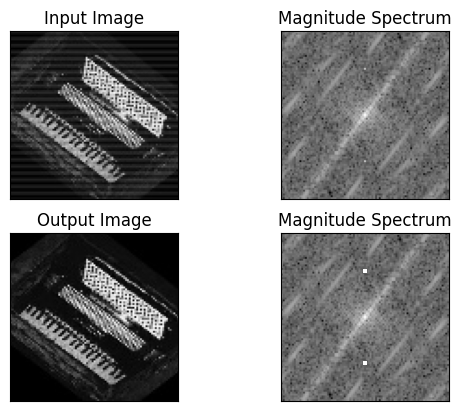

tensor(20)


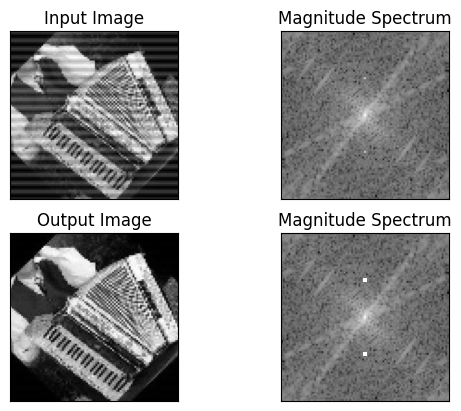

tensor(25)


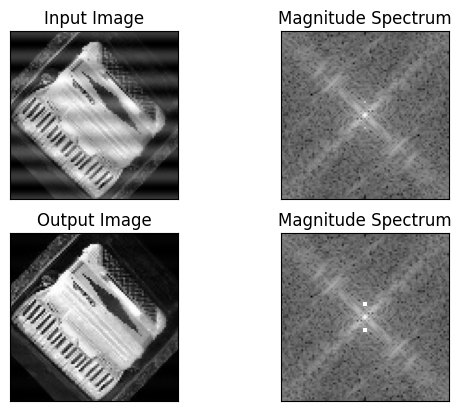

tensor(38)


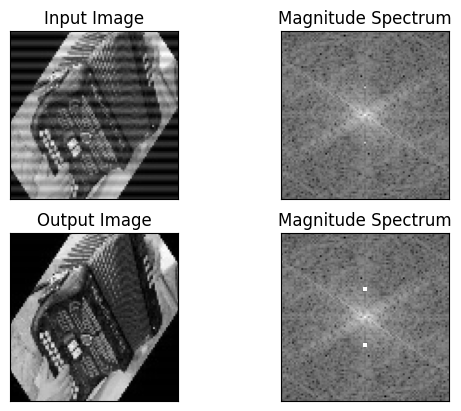

tensor(30)


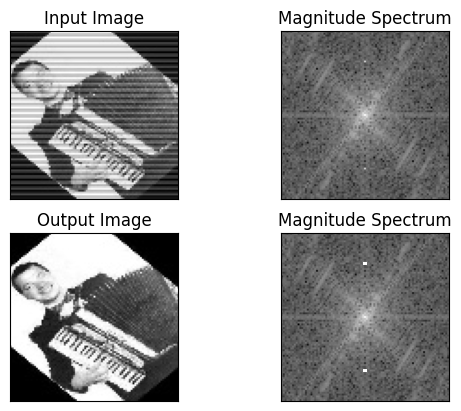

tensor(16)


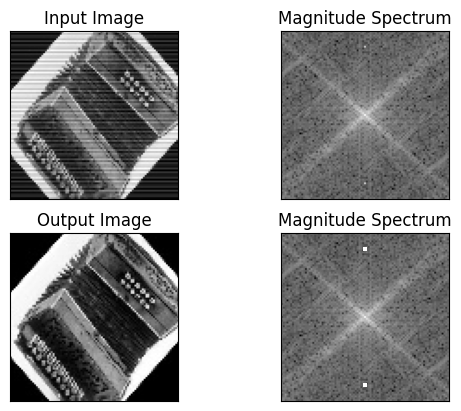

tensor(8)


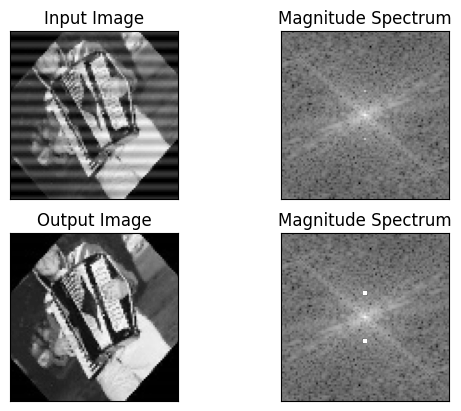

tensor(32)


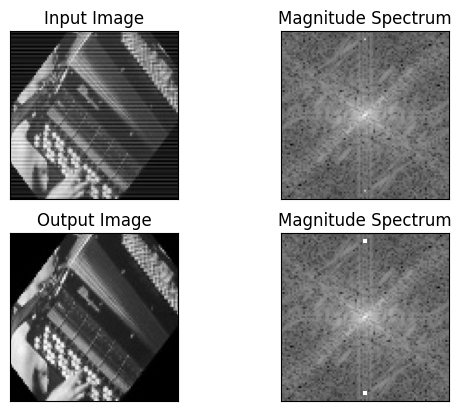

tensor(4)


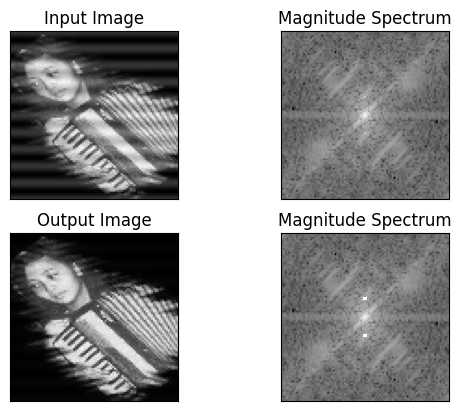

tensor(35)


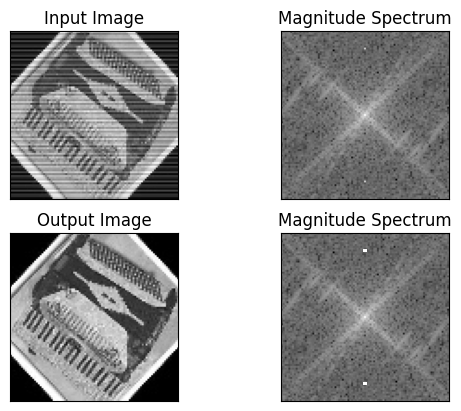

tensor(9)


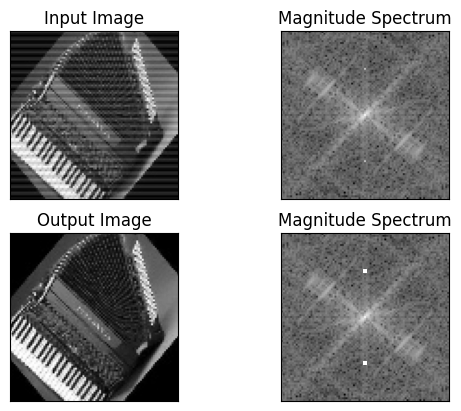

tensor(20)


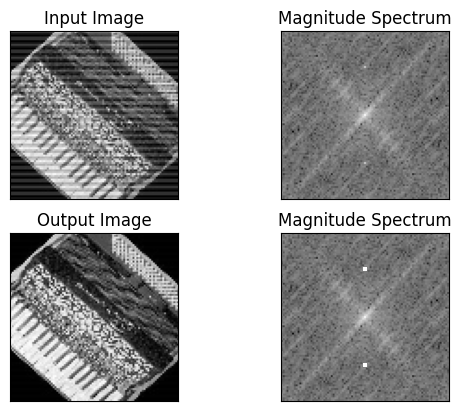

tensor(19)


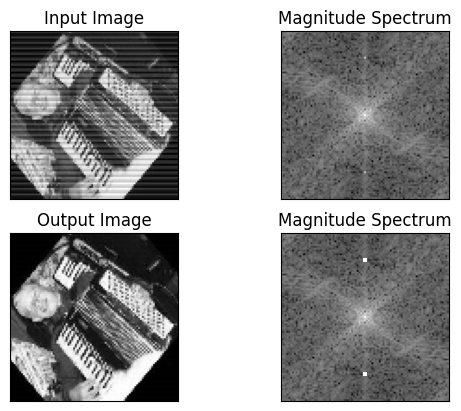

tensor(14)


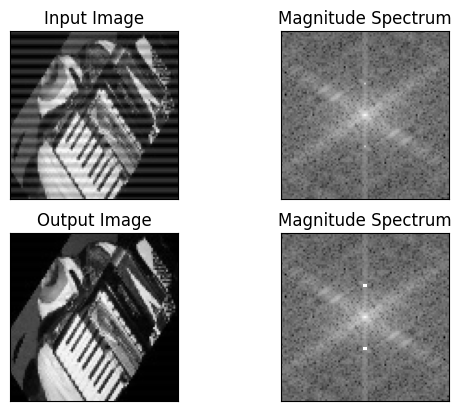

tensor(28)


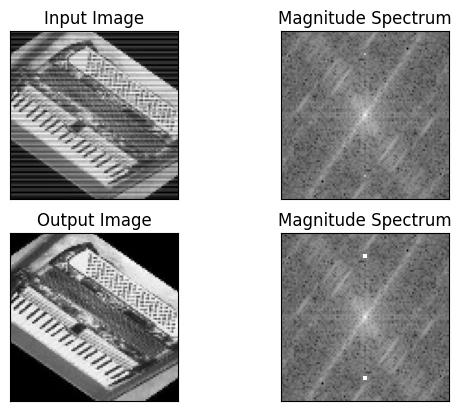

tensor(12)


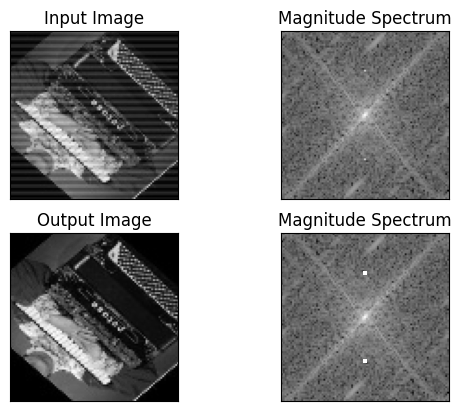

tensor(21)


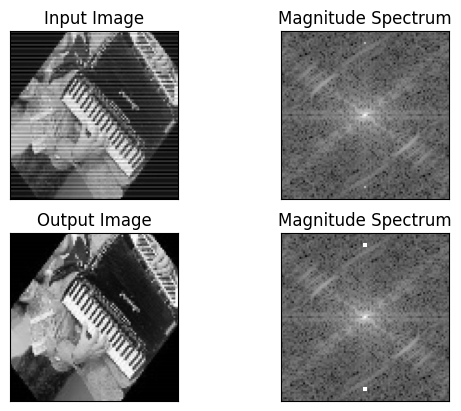

tensor(6)


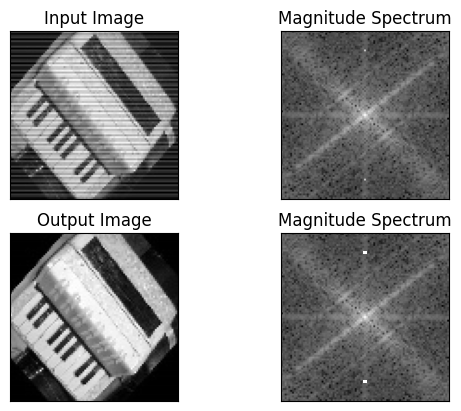

tensor(10)


In [ ]:
mini_dataset = RegularNoiseDataset('mini_train')
mini_loader = torch.utils.data.DataLoader(mini_dataset, batch_size=1)

for sample in mini_loader:
  img = sample['img'][0].numpy()
  row = sample['row'][0]

  img_denoised = remove_regular_noise(img[0], row, 45, plot=True)
  print(row)

### Simple Classification Model

We wil now train a simple classification model. We will use strides in the convolutions to quickly decrease the feature map size without pooling.

In [ ]:
from torch.nn import Sequential, Linear, ReLU, Softmax, Conv2d, MaxPool2d, AdaptiveAvgPool2d, Flatten

def build_model():
  model = Sequential(Conv2d(1, 64, 7, stride=3), ReLU(),
                    Conv2d(64, 64, 5, stride=2), ReLU(),
                    Conv2d(64, 64, 5, stride=2), ReLU(),
                    Conv2d(64, 64, 3), ReLU(),
                    Conv2d(64, 128, 3), ReLU(),
                    Flatten(),
                    Linear(128, 45))

  return model

We then simply train the model.

*Note:* It is possible that loading the data will take longer on the CPU than the calculation of the network itself. Therefore, if we had more cores available, it is better to use the `num_workers` argument greater than 1 in the `DataLoader` constructor.

In [ ]:
trainset = RegularNoiseDataset('train')
valset = RegularNoiseDataset('val')

batch_size = 32

dataloader_train = torch.utils.data.DataLoader(trainset, batch_size=batch_size, shuffle=True)
dataloader_val = torch.utils.data.DataLoader(valset, batch_size=batch_size, shuffle=False)

In [ ]:
model = build_model().cuda()
print(model)

ce_loss = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

for e in range(2):
  model.train()
  for i, samples in enumerate(dataloader_train):
    imgs = samples['img'].cuda()
    rows = samples['row'].cuda()
    optimizer.zero_grad()

    out = model(imgs)
    loss = ce_loss(out, rows - 1)
    loss.backward()
    optimizer.step()
    if i % 100 == 0:
      print("Loss at epoch: {} step {}: {}".format(e, i, loss.item()))

  model.eval()
  with torch.no_grad():
    val_losses = []
    correct = 0
    total = 0
    for i, samples in enumerate(dataloader_val):
      imgs = samples['img'].cuda()
      rows = samples['row'].cuda()

      out = model(imgs)
      loss = ce_loss(out, rows - 1)
      acc = torch.sum(torch.argmax(out, dim=-1) == rows - 1)
      correct += acc.item()
      val_losses.append(loss.item())
      total += len(rows)

    print("Val loss at epoch {}: {}".format(e, np.mean(val_losses)))
    print("Val acc at epoch {}: {}".format(e, correct / total))

Sequential(
  (0): Conv2d(1, 64, kernel_size=(7, 7), stride=(3, 3))
  (1): ReLU()
  (2): Conv2d(64, 64, kernel_size=(5, 5), stride=(2, 2))
  (3): ReLU()
  (4): Conv2d(64, 64, kernel_size=(5, 5), stride=(2, 2))
  (5): ReLU()
  (6): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1))
  (7): ReLU()
  (8): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1))
  (9): ReLU()
  (10): Flatten(start_dim=1, end_dim=-1)
  (11): Linear(in_features=128, out_features=45, bias=True)
)
Loss at epoch: 0 step 0: 3.816544532775879
Loss at epoch: 0 step 100: 0.19708161056041718
Loss at epoch: 0 step 200: 0.020372867584228516
Val loss at epoch 0: 0.07126505143371308
Val acc at epoch 0: 0.9774647887323944
Loss at epoch: 1 step 0: 0.4835928976535797
Loss at epoch: 1 step 100: 0.030016368255019188
Loss at epoch: 1 step 200: 0.017283251509070396
Val loss at epoch 1: 0.06753819427427112
Val acc at epoch 1: 0.9838028169014085


We will test the model.

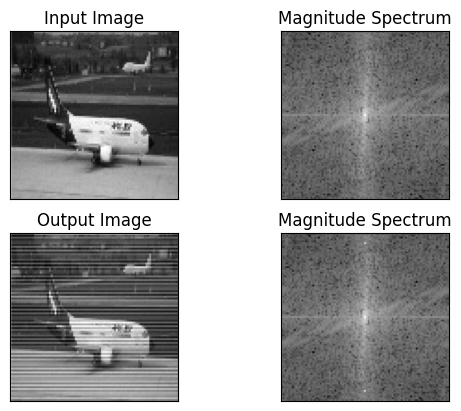

<ipython-input-4-0427fd5ba4e0>:49: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(np.abs(fshift))


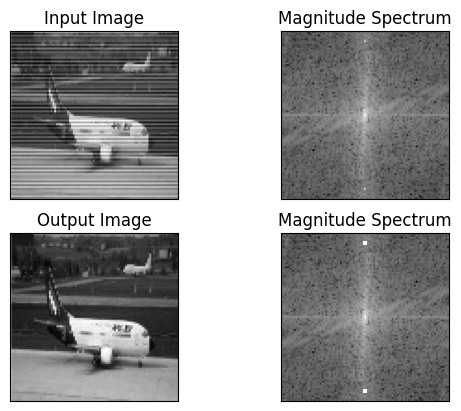

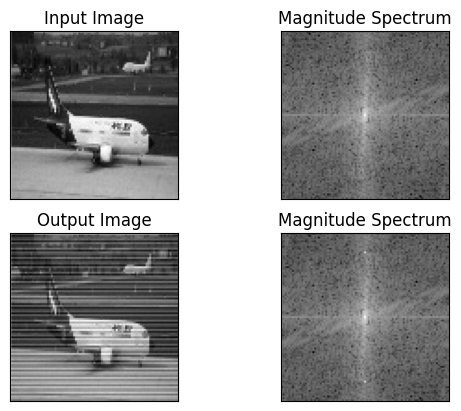

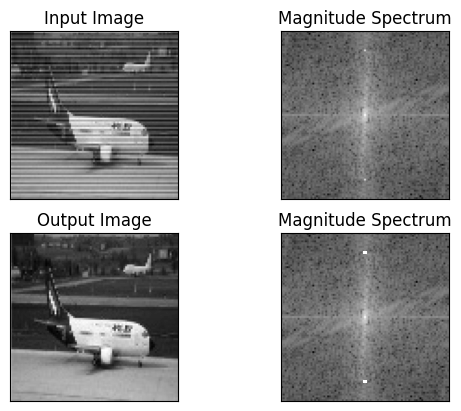

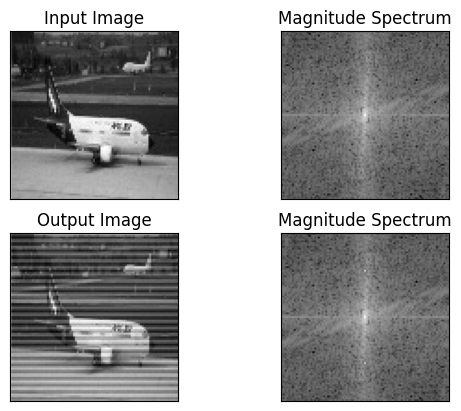

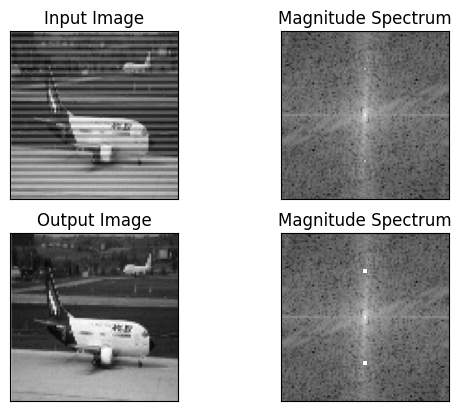

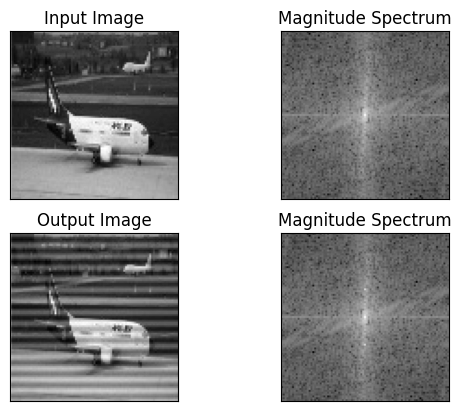

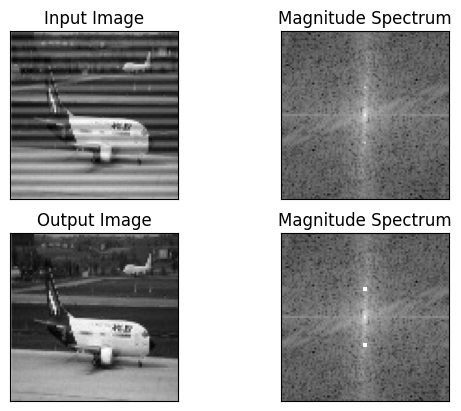

In [ ]:
for img_name in ['val/00091.jpg']:
  img = cv2.cvtColor(cv2.imread('val/00091.jpg'),cv2.COLOR_BGR2GRAY)

  for gt_rows in [5, 10, 20, 30]:
    img_modified = add_regular_noise(img, gt_rows, 45, plot=True)

    input = torch.from_numpy(img_modified[np.newaxis, np.newaxis, ...].astype(np.float32)).cuda()
    out = model(input)
    row = torch.argmax(out[0]) + 1
    img_repaired = remove_regular_noise(img_modified, row, 45, plot=True)

### Exercise 2 - Custom layer

Now we will implement our own layer. Since in our artificial case we always try to essentially identify the frequency of the added waves, we would like to identify these frequencies. For this, we use a convolution with a $91 \times 1$ kernel. We will have several of these kernels and each kernel will represent a certain frequency. The frequencies and phase shifts will be the learnable parameters. The kernel values $w_0, w_1, ... w_{90}$ for one frequency $\omega$ and phase $\phi$ will be:

$$ w_k = \mbox{sin}\left( \frac{2\pi \cdot k}{90} \omega + \phi \right)$$.

Before application, we subtract 0.5 from the image so that it is normalized. We apply this kernel without padding, so it eliminates one dimension (axis) of the tensor. After application, the average for the last two dimensions is calculated. Of course, such a specific kernel will not be able to be used anywhere other than at the beginning of our network.

We will implement the practical implementation according to the [documentation](https://pytorch.org/docs/stable/generated/torch.nn.Module.html?highlight=module#torch.nn.Module).

So we need a class that inherits from `torch.nn.Module`. In the constructor, we must also call the constructor of the superclass. In the constructor, we remember how many filters we want to use. In this method, it is also necessary to initialize the trainable variables (frequency vector and phase vector) of the `torch.nn.parameter.Parameter` class. When using this class, these parameters are automatically added to the trainable variables of the module. It is important to initialize the variables correctly. For this we will use a uniform distribution using `torch.rand` as the first arugment of the `Variable` constructor. We initialize the frequencies from -100 to 100 and the phase from $-\frac{\pi}{2}$ to $\frac{\pi}{2}$. The second argument is `requires_grad=True`.

Then we still need the `forward` method. It has an input tensor as its only argument. We have to compose the internal logic from basic torch functions. First, we generate a kernel using the values $\frac{2\pi \cdot k}{90}$. To generate k you will need `torch.linspace` or a similar method. Here it is important to send the tensor `k` to the device the same as the input argument of the forward function using the method e.g.: `k.to(x.device)`. Alternatively, it is possible to declare `k` in the constructor using the `self.register_buffer` method, in which case it will not always have to be generated anew and it will always be initialized on the same device as the entire model. We then multiply the vector `k` with frequencies so that the dimensions fit (we use matrix multiplication, so we add singleton dimensions to the vector to make it work). Then we add the phases to them and apply a sine. We generate the kernel so that we can use it using [torch.nn.functional.conv2d](https://pytorch.org/docs/stable/generated/torch.nn.functional.conv2d.html?highlight=torch%20functional%20conv2d#torch.nn.functional.conv2d).

We will use `torch.nn.functional.conv2d` with our kernel for the input tensor from which we subtract one half. Subsequently, we average the values over the last two dimensions using `torch.mean`.

In [ ]:
class WaveLayer(torch.nn.Module):
  def __init__(self, num_weights):
    super(WaveLayer, self).__init__()
    self.phases = torch.nn.parameter.Parameter(torch.pi * torch.rand(num_weights) - torch.pi/2, requires_grad=True)
    self.weights = torch.nn.parameter.Parameter(200 * torch.rand(num_weights) - 100, requires_grad=True)
    self.register_buffer('k', torch.linspace(0, 2 * torch.pi, 91))

  def forward(self, x):
    # if we do not use a buffer we have to do the following
    # k =  torch.linspace(0, 2 * torch.pi, 91).to(x.device)

    kernel = torch.sin(self.weights[:, None, None, None] * self.k[None, None, : , None] + self.phases[:, None, None, None])
    x = torch.nn.functional.conv2d(x, kernel, padding=0)
    x = torch.mean(x, dim=-1)
    x = torch.mean(x, dim=-1)
    return x


We can test the layer.

In [ ]:
wave_layer = WaveLayer(200)

rand_input = torch.randn(1, 1, 91, 91)

output = wave_layer(rand_input)

# output should be [1, 200]
print(output.size())

torch.Size([1, 200])


We can create a simple model and train the network.

In [ ]:
from torch.nn import Sequential, Linear, ReLU

def build_custom_model():
  model = Sequential(WaveLayer(128),
                     Linear(128, 64), ReLU(),
                     Linear(64, 45))

  return model

We can chech whether $\phi$ and $\omega$ are trainable parameters of the model.

In [ ]:
print([p.size() for p  in build_custom_model().parameters()])

[torch.Size([128]), torch.Size([128]), torch.Size([64, 128]), torch.Size([64]), torch.Size([45, 64]), torch.Size([45])]


In [ ]:
custom_model = build_custom_model().cuda()
print(custom_model)

ce_loss = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(custom_model.parameters(), lr=1e-3)

for e in range(3):
  model.train()
  for i, samples in enumerate(dataloader_train):
    imgs = samples['img'].cuda()
    rows = samples['row'].cuda()
    optimizer.zero_grad()

    out = custom_model(imgs)
    loss = ce_loss(out, rows - 1)
    loss.backward()
    optimizer.step()
    if i % 100 == 0:
      print("Loss at epoch: {} step {}: {}".format(e, i, loss.item()))

  model.eval()
  with torch.no_grad():
    val_losses = []
    correct = 0
    total = 0
    for i, samples in enumerate(dataloader_val):
      imgs = samples['img'].cuda()
      rows = samples['row'].cuda()

      out = custom_model(imgs)
      loss = ce_loss(out, rows - 1)
      acc = torch.sum(torch.argmax(out, dim=-1) == rows - 1)
      correct += acc.item()
      val_losses.append(loss.item())
      total += len(rows)

    print("Val loss at epoch {}: {}".format(e, np.mean(val_losses)))
    print("Val acc at epoch {}: {}".format(e, correct / total))

Sequential(
  (0): WaveLayer()
  (1): Linear(in_features=128, out_features=64, bias=True)
  (2): ReLU()
  (3): Linear(in_features=64, out_features=45, bias=True)
)
Loss at epoch: 0 step 0: 3.9630885124206543
Loss at epoch: 0 step 100: 0.9439674019813538
Loss at epoch: 0 step 200: 0.26916074752807617
Val loss at epoch 0: 0.24253059625625611
Val acc at epoch 0: 0.9746478873239437
Loss at epoch: 1 step 0: 0.16735513508319855
Loss at epoch: 1 step 100: 0.13104042410850525
Loss at epoch: 1 step 200: 0.0655422955751419
Val loss at epoch 1: 0.11222290667808718
Val acc at epoch 1: 0.9845070422535211
Loss at epoch: 2 step 0: 0.054920341819524765
Loss at epoch: 2 step 100: 0.08500826358795166
Loss at epoch: 2 step 200: 0.006526781711727381
Val loss at epoch 2: 0.07651263577863573
Val acc at epoch 2: 0.9852112676056338


We can also test the model.

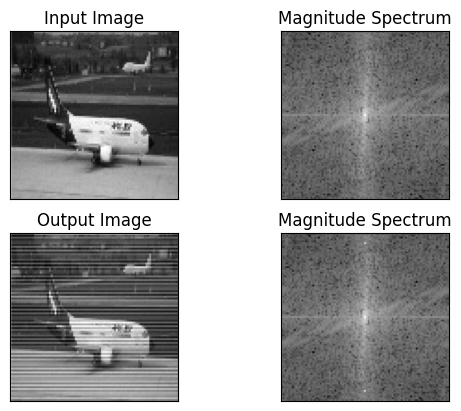

<ipython-input-4-0427fd5ba4e0>:49: RuntimeWarning: divide by zero encountered in log
  magnitude_spectrum = 20 * np.log(np.abs(fshift))


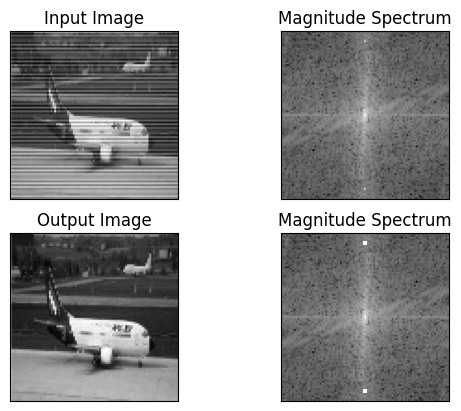

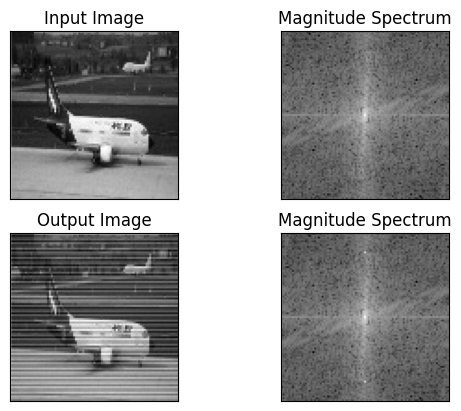

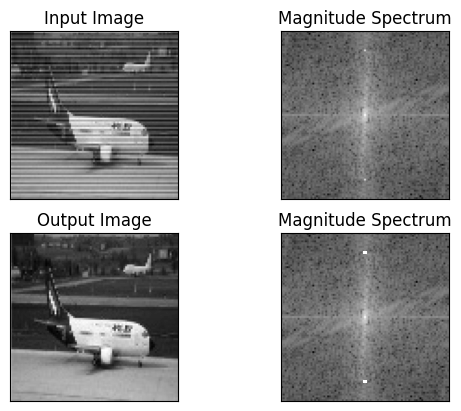

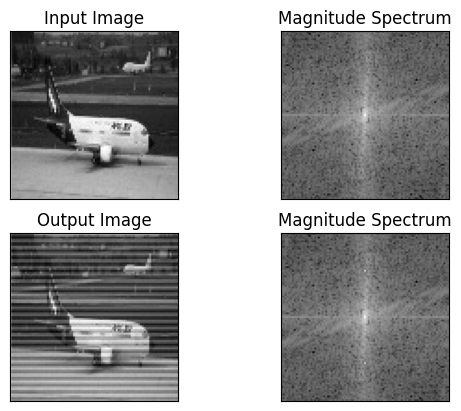

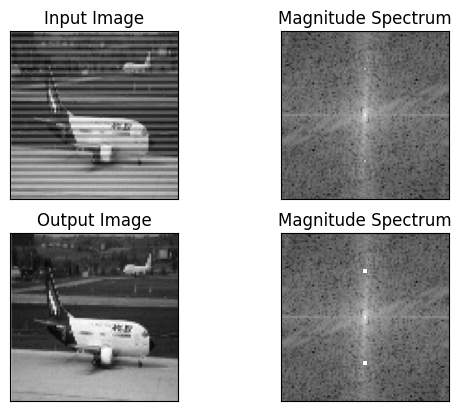

...

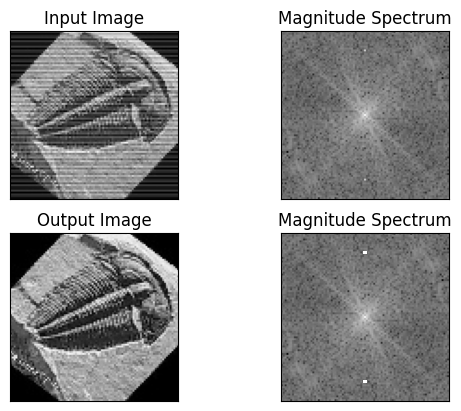

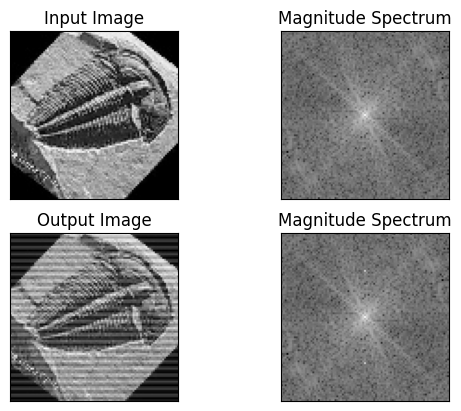

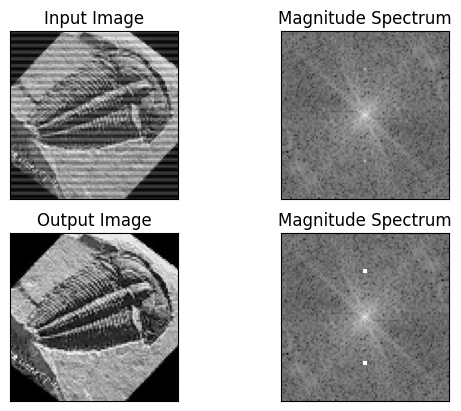

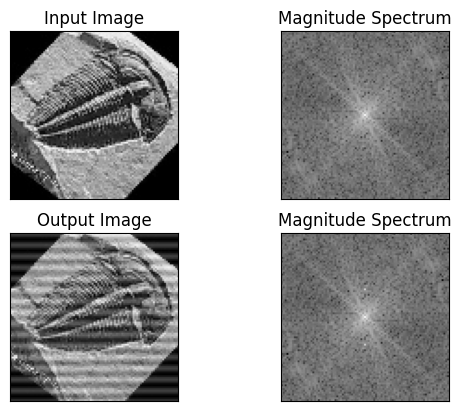

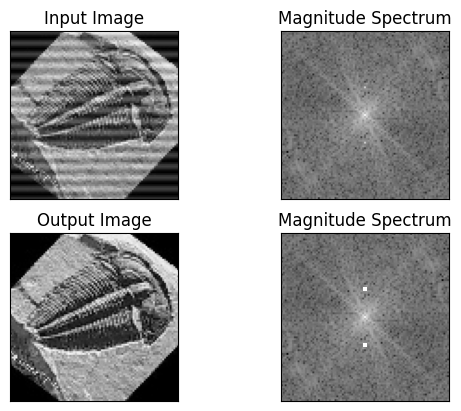

In [ ]:
for img_name in ['val/00091.jpg', 'val/00572.jpg', 'val/01320.jpg']:
  img = cv2.cvtColor(cv2.imread(img_name),cv2.COLOR_BGR2GRAY)

  for gt_rows in [5, 10, 20, 30]:
    img_modified = add_regular_noise(img, gt_rows, 45, plot=True)

    input = torch.from_numpy(img_modified[np.newaxis, np.newaxis, ...].astype(np.float32)).cuda()
    out = custom_model(input)
    row = torch.argmax(out[0]) + 1
    img_repaired = remove_regular_noise(img_modified, row, 45, plot=True)

## Bonus Exercises - Regression

So far we have solved the task as a classification problem. Try to implement a network that will have only one value at the output and it will then be rounded to the nearest int in the range from 1 to 45. For training, try to use the MSE (a.k.a L2) Loss.

### Custom loss function

MSE may not be the absolute best loss function even if though is commonly used. We define the so-called smooth L1 cost function. It is subjected to the L1 norm, except that it is smooth around zero. The definition is as follows:

$$ smooth_{L1}(x) = \begin{cases} \frac{1}{2} x^2 & \mbox{if}~|x| \le 1 \\|x| - \frac{1}{2} & \mbox{otherwise} \end{cases}$$

Implementation is simple. It is necessary to create a function that has y_pred and y_true as input. Use only `torch.*` or `torch.nn.functional` functions in the function. You can e.g. `torch.mean`, `torch.where`, etc.

### Custom metrics

If you are going to oputput the accuracy during training, it would be better to output, for example, the accuracy with a tolerance of +/- 3, so that we know if we are approaching a better result. Try to implement such function so that it reports these results during training.